In [1]:
using LinearAlgebra
using Symbolics
using Plots
using LaTeXStrings
using Distributions
#using Interact
using CSV
using Random
using DataFrames

In [2]:
function symN(N)
    @variables X,Y,Z,M,x[1:N],y[1:N],z[1:N],v_x[1:N],v_y[1:N],v_z[1:N],t,m[1:N],a_x[1:N],a_y[1:N],a_z[1:N],r
    r0=[X,Y,Z]
    rs=[[x...]';[y...]';[z...]']'
    vs=[[v_x...]';[v_y...]';[v_z...]']'
    return x,y,z,v_x,v_y,v_z,r0,rs,vs,m,t,X,Y,Z,M
end


symN (generic function with 1 method)

### Runge Kutta 5to Orden

In [19]:
function RK5(c0,dt,t0,tf,F1,vs,R,estoc,vari,gg)
    F1=hcat(vs,F1,zeros(N))
    F=build_function(F1,[x...]...,[y...]...,[z...]...,[v_x...]...,[v_y...]...,[v_z...]...,t,expression=Val{false})
    ##vectores
    ts=collect(t0:dt:tf)
    TT=0#tiempo en completar orbita
    n=length(ts)
    #g=9.81
    ####################################Posiciones
    xs=zeros(N,n)
    ys=zeros(N,n)
    zs=zeros(N,n)
    
    vxs=zeros(N,n)
    vys=zeros(N,n)
    vzs=zeros(N,n)
    
    rt=zeros(N,7)
    rt[:,end]=ones(N,1)
    #####################################Velocidades
    
#############Condiciones iniciales
    xs[:,1]=c0[:,1]
    ys[:,1]=c0[:,2]
    zs[:,1]=c0[:,3]
    vxs[:,1]=c0[:,4]
    vys[:,1]=c0[:,5]
    vzs[:,1]=c0[:,6]

#CSV.write("Test2.csv", DataFrame(Xs=[], Ys=[], Zs=[]), writeheader=true)

for i in 1:n-1
        #Runge Kutta
        z0=hcat(xs[:,i],ys[:,i],zs[:,i],vxs[:,i],vys[:,i],vzs[:,i],ones(N).*ts[i])

        k1=F[1](z0...)
        #k1[:,end]=zeros(N,1)
        k2=F[1](z0.+(dt*k1)/4...)
        #k2[:,end]=zeros(N,1)
        k3=F[1](z0.+rt*(dt/4)+dt*(k1+k2)/8...)####dt/4
        #k3[:,end]=zeros(N,1)
        k4=F[1](z0.+rt*(dt/2)+dt*(-k2/2+k3)...)####dt/2
        #k4[:,end]=zeros(N,1)
        k5=F[1](z0.+rt*(dt*3/4)+dt*(3*k1+9*k4)/16...)#dt*3/4
        #k5[:,end]=zeros(N,1)
        k6=F[1](z0.+rt*dt+dt*(-3*k1+2*k2+12*k3-12*k4+8*k5)/7...)
        #k6[:,end]=zeros(N,1)
        
        #k1=F[1](z0...)
        #k2=F[1](z0.+(dt*k1)/2...)
        #k3=F[1](z0.+dt*(3*k1+k2)/16...)
        #k4=F[1](z0.+dt*k3/2...)
        #k5=F[1](z0.+dt*(-3*k2+6*k3+9*k4)/16...)
        #k6=F[1](z0.+dt*(k1+4*k2+6*k3-12*k4+8*k5)/7...)
        
        k1=7*(k1+k6)
        k3=16*k3
        k2=16*k5
        k4=12*k4
        if estoc==true
            dWx=rand(Normal(0, sqrt(vari)),N)
            dWy=rand(Normal(0, sqrt(vari)),N)
            dWz=rand(Normal(0, sqrt(vari)),N)
        else
            dWx=zeros(N)
            dWy=zeros(N)
            dWz=zeros(N)

        end
        
        xs[:,i+1]=xs[:,i]+(dt/90)*(k1[:,1]+2*k2[:,1]+2*k3[:,1]+k4[:,1])+gg*dWx
        ys[:,i+1]=ys[:,i]+(dt/90)*(k1[:,2]+2*k2[:,2]+2*k3[:,2]+k4[:,2])+gg*dWy
        zs[:,i+1]=zs[:,i]+(dt/90)*(k1[:,3]+2*k2[:,3]+2*k3[:,3]+k4[:,3])+gg*dWz
        
        vxs[:,i+1]=vxs[:,i]+(dt/90)*(k1[:,4]+2*k2[:,4]+2*k3[:,4]+k4[:,4])
        vys[:,i+1]=vys[:,i]+(dt/90)*(k1[:,5]+2*k2[:,5]+2*k3[:,5]+k4[:,5])
        vzs[:,i+1]=vzs[:,i]+(dt/90)*(k1[:,6]+2*k2[:,6]+2*k3[:,6]+k4[:,6])

        
        #xs1=xs[:,1:i+1]
        #ys1=ys[:,1:i+1]
        #zs1=zs[:,1:i+1]
        
        #CSV.write("xs1_matrix.csv", DataFrame(xs1', :auto), writeheader=false)
        #CSV.write("ys1_matrix.csv", DataFrame(ys1', :auto), writeheader=false)
        #CSV.write("zs1_matrix.csv", DataFrame(zs1', :auto), writeheader=false)

        #info = Dict(
        #"Xs" => xs'[i,1],
        #"Ys" => ys'[i,1],
        #"Zs" => zs'[i,1])
        # Append data to CSV file
        #CSV.write("Test2.csv", DataFrame([info]), append=true, header=false)
        #sleep(0.1)
        
        
        #axs3[i]=h1(xs1[i],xs2[i],xs3[i],ys1[i],ys2[i],ys3[i],zs1[i],zs2[i],zs3[i],vxs1[i],vxs2[i],vxs3[i],vys1[i],vys2[i],vys3[i],vzs1[i],vzs2[i],vzs3[i],ts[i])    
        #ays3[i]=h2(xs1[i],xs2[i],xs3[i],ys1[i],ys2[i],ys3[i],zs1[i],zs2[i],zs3[i],vxs1[i],vxs2[i],vxs3[i],vys1[i],vys2[i],vys3[i],vzs1[i],vzs2[i],vzs3[i],ts[i])
        #azs3[i]=h3(xs1[i],xs2[i],xs3[i],ys1[i],ys2[i],ys3[i],zs1[i],zs2[i],zs3[i],vxs1[i],vxs2[i],vxs3[i],vys1[i],vys2[i],vys3[i],vzs1[i],vzs2[i],vzs3[i],ts[i]);
    end
    
    ll = length(xs[1, :])
    NNN=800
    if ll > NNN
        step = div(ll, NNN)  # Calculate the step size to get around 1000 elements
        lll = 1:step:ll
        lll = collect(lll)  # Convert the range to a vector if needed
    else
        lll = 1:ll  # Keep the original indices if ll is 1000 or fewer
    end

    return xs[:,lll],ys[:,lll],zs[:,lll],vxs[:,lll],vys[:,lll],vzs[:,lll],ts[lll]
   
    ########Graficas####################################
end  

RK5 (generic function with 1 method)

## Problema de los $N$ cuerpos

In [4]:
N=4;
x,y,z,v_x,v_y,v_z,r0,rs,vs,m,t,X,Y,Z,M=symN(N);

In [56]:

k=39
##Ecuaciones
r=norm(r0)
Fs=zeros(N,3)*r0[1];
a=-k*(M/r^2)*(r0/r)
for j in 1:N ###Fuerza que siente F_j
    for i in 1:N
        if j!=i
            R=rs[j,:]-rs[i,:]
            #pp=m[i]
            Fs[j,:]+=substitute(a,Dict.(X=>R[1],Y=>R[2],Z=>R[3],M=>m[i],r=>norm(R))) ;### ca,mbair masas
        end
    end
end
Fs
masas=rand(Normal(0.01, 1),N, 6)#[m1;m2;m3]'#ones(N)
for i in 1:N
    Fs=substitute.(Fs,Dict.(m[i]=>masas[i]));
end
####Ecuacione
Fs;
conds=rand(Normal(0, 2),N, 6);

Ecuaciones

In [57]:

tf=5
dt=0.0001
xs,ys,zs,vxs,vys,vzs,ts=RK5(conds,dt,0,tf,Fs,vs,false,false,0,0);


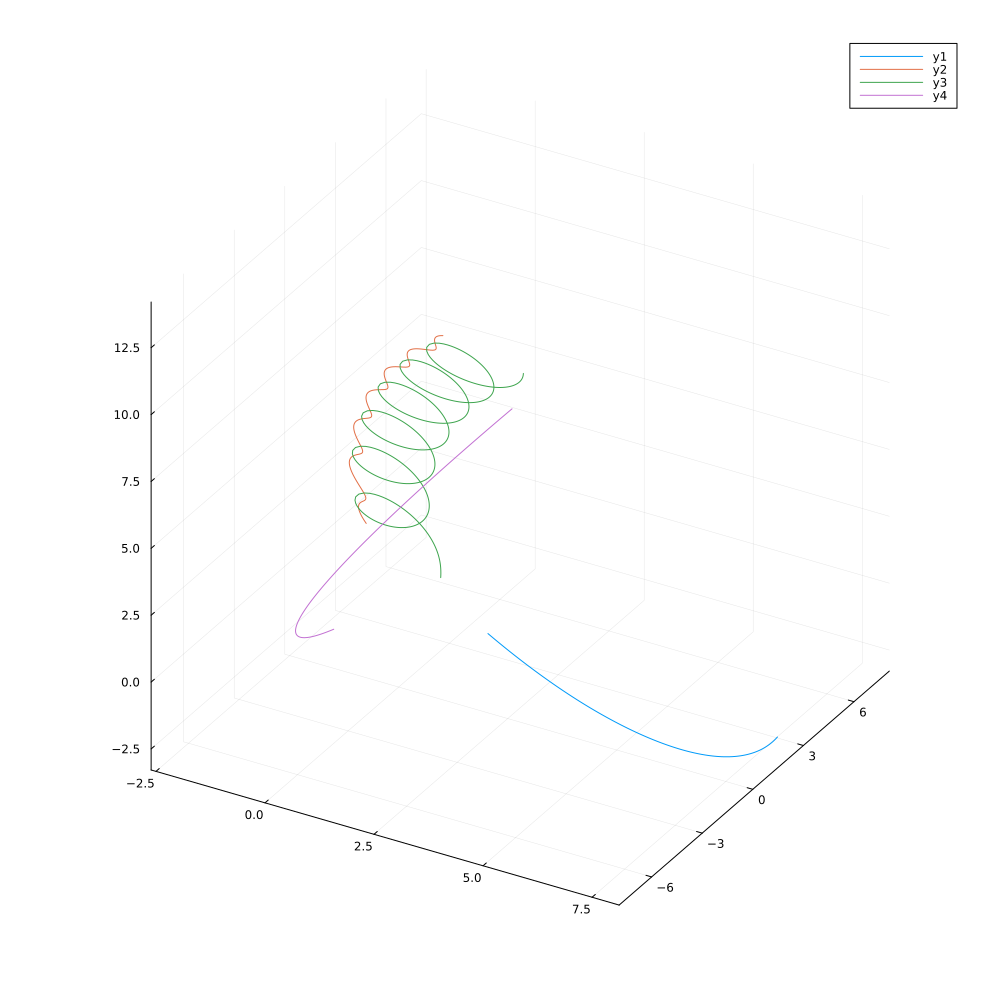

In [58]:
plot(xs',ys',zs')

In [260]:
@manipulate for ss in -10:0.001:10
    @manipulate for θ in -100:1:90
        @manipulate for ϕ in -380:1:360
            @manipulate for tt in 1:1:length(ts)
                gr()
                gr(size=(1000,1000))   
                plot(xs[:,1:tt]',ys[:,1:tt]',zs[:,1:tt]',bgcolor="black",xlim = [minimum(xs), maximum(xs)],ylim = [minimum(ys), maximum(ys)],label="",zlim = (minimum(zs), maximum(zs)),camera=(ϕ, θ),size=(1000, 1000,1000),lw=2)
                scatter!(xs[:,tt]',ys[:,tt]',zs[:,tt]',label="",ms=ss)
            end
        end
    end
end

Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["ss"], Dict{Symbol, Any}(:className => "interact ", :style => Dict{Any, Any}(:padding => "5px 10px 0px 10px")))], Dict{Symbol, Any}(:className => "interact-flex-row-left")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol, Any}(:max => 20001, :min => 1, :attributes => Dict{Any, Any}(:type => "range", Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}", "orient" => "horizontal"), :step => 1, :className => "slider slider is-fullwidth", :style => Dict{Any, Any}()))], Dict{Symbol, Any}(:className => "interact-flex-row-center")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol, Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol, Any}(:className => "interact-flex-row-right"))], Dict{Symbol, Any}(:className => "interact-flex-row interact-widget")), Dict{String, Tuple{AbstractObservable, Union{Nothing, Bool}}}("changes" => (Observable(0), nothing), "index" => (Observable{Any}(10001), nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "C:\\Users\\Arif\\.julia\\packages\\Knockout\\HReiN\\src\\..\\assets\\knockout.js"), Asset("js", "knockout_punches", "C:\\Users\\Arif\\.julia\\packages\\Knockout\\HReiN\\src\\..\\assets\\knockout_punches.js"), Asset("js", nothing, "C:\\Users\\Arif\\.julia\\packages\\InteractBase\\LJXv3\\src\\..\\assets\\all.js"), Asset("css", nothing, "C:\\Users\\Arif\\.julia\\packages\\InteractBase\\LJXv3\\src\\..\\assets\\style.css"), Asset("css", nothing, "C:\\Users\\Arif\\.julia\\packages\\Interact\\PENUy\\src\\..\\assets\\bulma_confined.min.css")], Dict{Any, Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Base.GenericCondition{ReentrantLock}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x000002f3aaec4bb0, Task (runnable) @0x000002f3aaec4bb0), ReentrantLock(nothing, 0x00000000, 0x00, Base.GenericCondition{Base.Threads.SpinLock}(Base.InvasiveLinkedList{Task}(nothing, nothing), Base.Threads.SpinLock(0)), (6, 3241434267456, 3245188601648)))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n            );\n        }\n    };\n    var json_data = {\"formatted_vals\":[\"-10.0\",\"-9.999\",\"-9.998\",\"-9.997\",\"-9.996\",\"-9.995\",\"-9.994\",\"-9.

[ Info: Saved animation to C:\Users\Arif\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\Files\Escuela\Carrera\N-ecsdifs\4-Cuerpos.gif


Plots.AnimatedGif("C:\\Users\\Arif\\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\\Files\\Escuela\\Carrera\\N-ecsdifs\\4-Cuerpos.gif")
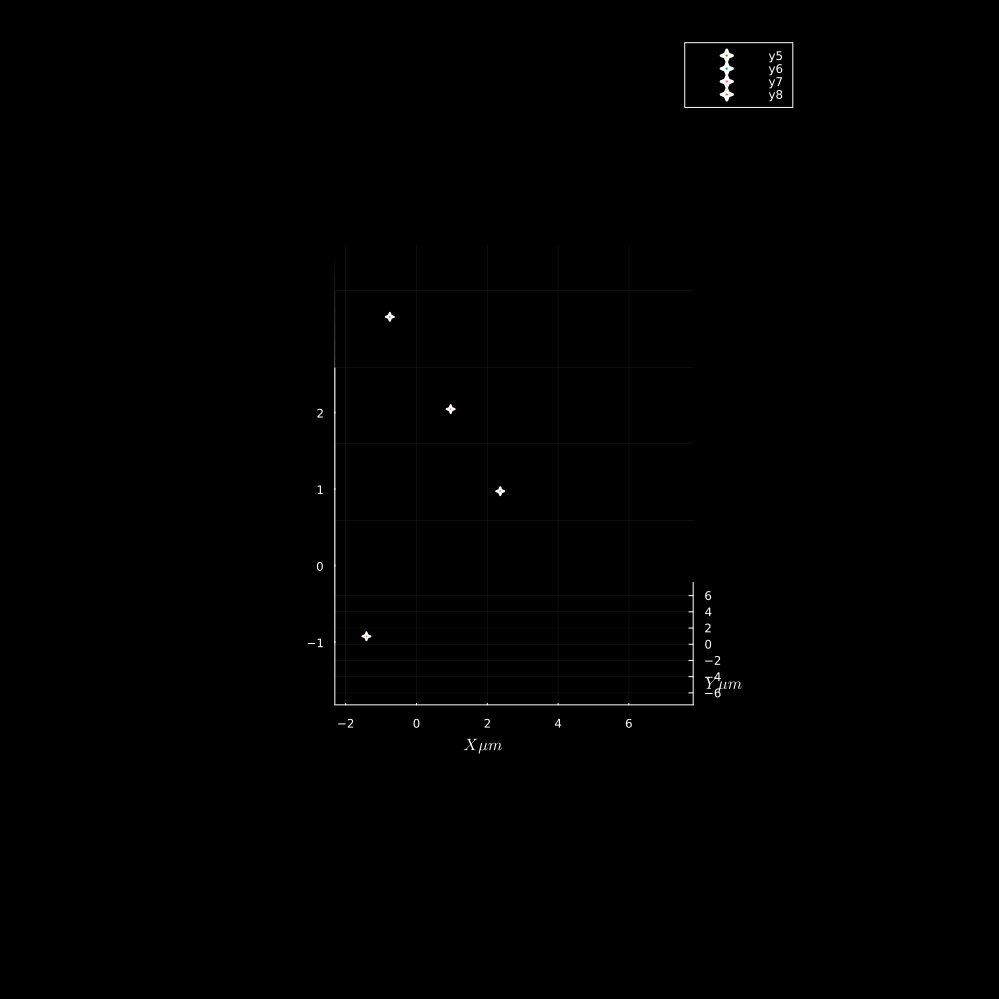

In [59]:
animac(xs,ys,zs,N,length(ts),0,1.5,string(N)*"-Cuerpos")

## Dinamica Browniana Problema de $N$ particulas

$$U=4ϵ((\frac{σ}{r})^{12}-(\frac{σ}{r})^{6})$$


In [242]:
N=50;
x,y,z,v_x,v_y,v_z,r0,rs,vs,m,t,X,Y,Z,M=symN(N);
@variables r,ϵ,σ
U=4*ϵ*((σ/r)^12-(σ/r)^6)
Dr=Differential(r)
FLJ=-simplify(expand_derivatives(Dr(U)))*(r0/r);
FLJ1=substitute(FLJ,Dict(σ=>1,ϵ=>1));



In [243]:
Fs=zeros(N,3)*r0[1];
for j in 1:N ###Fuerza que siente F_j
    for i in 1:N
        if j!=i
            R=rs[j,:]-rs[i,:]
            #pp=m[i]
            Fs[j,:]+=substitute(FLJ1,Dict.(X=>R[1],Y=>R[2],Z=>R[3],M=>m[i],r=>norm(R))) ;### ca,mbair masas
        end
    end
end
Fs;

In [244]:
m=0.5 #0.5 #pg -> 5e-16 Kg
γ=0.01#*(1e9)# pg/s 0.01 #pNs/μm 0.01*(1e-12)*(1e6)
Kb=1.380649*(10^(-5))#pg μm/s^2 ###J/K; 
dt=0.1
vari=dt#:o## Varianza (σ^2)
T=300
g=sqrt(2*γ*Kb*T)
conds=rand(Normal(0, 5),N, 6)
tf=10

xs,ys,zs,vxs,vys,vzs,ts=RK5(conds,dt,0,tf,Fs/m,vs,false,true,vari,g/γ);


In [248]:
@manipulate for ss in 0.01:0.001:10
    @manipulate for θ in 20:1:90
        @manipulate for ϕ in 0:1:360
            @manipulate for tt in 1:1:length(ts)
                #gr(size=(1000,1000))   
                plot(xs[:,1:tt]',ys[:,1:tt]',zs[:,1:tt]',bgcolor="black",xlim = [minimum(xs), maximum(xs)],ylim = [minimum(ys), maximum(ys)],label="",zlim = (minimum(zs), maximum(zs)),camera=(ϕ, 20),size=(1000,1000))
                scatter!(xs[:,tt]',ys[:,tt]',zs[:,tt]',label="",ms=ss)
            end
        end
    end
end

Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["ss"], Dict{Symbol, Any}(:className => "interact ", :style => Dict{Any, Any}(:padding => "5px 10px 0px 10px")))], Dict{Symbol, Any}(:className => "interact-flex-row-left")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol, Any}(:max => 9991, :min => 1, :attributes => Dict{Any, Any}(:type => "range", Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}", "orient" => "horizontal"), :step => 1, :className => "slider slider is-fullwidth", :style => Dict{Any, Any}()))], Dict{Symbol, Any}(:className => "interact-flex-row-center")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol, Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol, Any}(:className => "interact-flex-row-right"))], Dict{Symbol, Any}(:className => "interact-flex-row interact-widget")), Dict{String, Tuple{AbstractObservable, Union{Nothing, Bool}}}("changes" => (Observable(0), nothing), "index" => (Observable{Any}(4996), nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "C:\\Users\\Arif\\.julia\\packages\\Knockout\\HReiN\\src\\..\\assets\\knockout.js"), Asset("js", "knockout_punches", "C:\\Users\\Arif\\.julia\\packages\\Knockout\\HReiN\\src\\..\\assets\\knockout_punches.js"), Asset("js", nothing, "C:\\Users\\Arif\\.julia\\packages\\InteractBase\\LJXv3\\src\\..\\assets\\all.js"), Asset("css", nothing, "C:\\Users\\Arif\\.julia\\packages\\InteractBase\\LJXv3\\src\\..\\assets\\style.css"), Asset("css", nothing, "C:\\Users\\Arif\\.julia\\packages\\Interact\\PENUy\\src\\..\\assets\\bulma_confined.min.css")], Dict{Any, Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Base.GenericCondition{ReentrantLock}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x000002f38635c5e0, Task (runnable) @0x000002f38635c5e0), ReentrantLock(nothing, 0x00000000, 0x00, Base.GenericCondition{Base.Threads.SpinLock}(Base.InvasiveLinkedList{Task}(nothing, nothing), Base.Threads.SpinLock(0)), (1, 3241357226992, 3241880959416)))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n            );\n        }\n    };\n    var json_data = {\"formatted_vals\":[\"0.01\",\"0.011\",\"0.012\",\"0.013\",\"0.014\",\"0.015\",\"0.016\",\"0.017\",\"0.

[ Info: Saved animation to C:\Users\Arif\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\Files\Escuela\Carrera\N-ecsdifs\dinamicabrowniana5Cuerpos.gif


Plots.AnimatedGif("C:\\Users\\Arif\\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\\Files\\Escuela\\Carrera\\N-ecsdifs\\dinamicabrowniana5Cuerpos.gif")
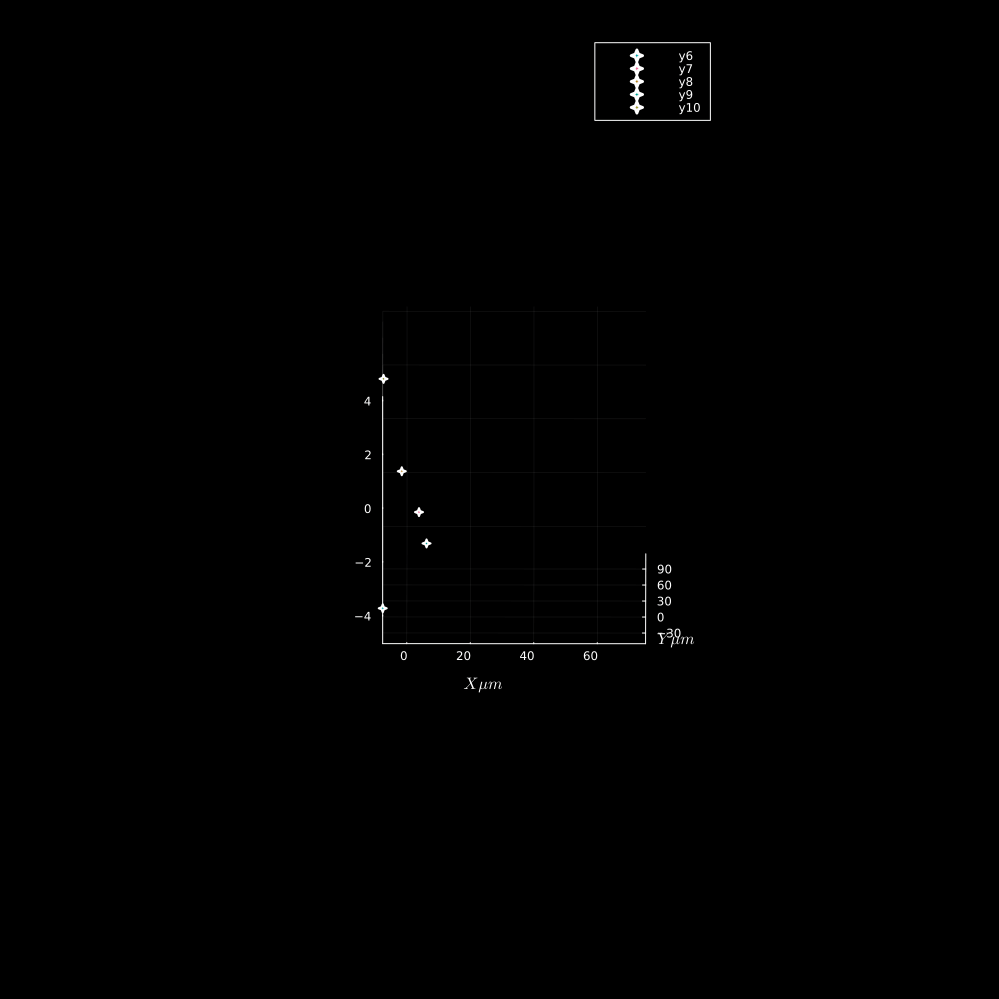

In [240]:
animac(xs,ys,zs,N,length(ts),(1/20),1/2,"dinamicabrowniana"*string(N)*"Cuerpos")

# Animacion 2D

In [14]:
n=length(ts)
mm=5
xx=vcat(xs1,xs2,xs3)
yy=vcat(ys1,ys2,ys3)
sc=1/100
anim2d=@animate for i in 1:10:n;
    gr(size=(1000,1000))
    Legend=(bgcolor=(:dark))
    a=1
    if i>1
        a=range(0,1,length=i)
    end 
    
    Plots.plot(xs1[1:i],ys1[1:i],color="yellow",lw=2,xlim = [minimum(xx)-1, maximum(xx)+1],
    ylim = [minimum(yy)-1, maximum(yy)+1],label="",xlabel="x",ylabel="y",bgcolor="black",grid=false,axis=false,alpha=a);
    Plots.scatter!([xs1[i]],[ys1[i]], color = "yellow", markersize = mm,label="Masa1");
    Plots.quiver!([xs1[i]],[ys1[i]],quiver=([axs1[i].*sc],[ays1[i].*sc]),color="yellow",lw=3,length=1/80)
    
    Plots.plot!(xs2[1:i],ys2[1:i],color="blue",lw=2,label="",alpha=a);
    #Plots.scatter!([xs2[i]],[ys2[i]], color = "blue", markersize = mm ,label="Masa2");
    #Plots.quiver!([xs2[i]],[ys2[i]],quiver=([axs2[i].*sc],[ays2[i].*sc]),color="blue",lw=3,length=1/80)
    
    Plots.plot!(xs3[1:i],ys3[1:i],color="red",lw=2,label="",alpha=a);
    #Plots.scatter!([xs3[i]],[ys3[i]], color = "red", markersize = mm,label="Masa3");
    #Plots.quiver!([xs3[i]],[ys3[i]],quiver=([axs3[i].*sc],[ays3[i].*sc]),color="red",lw=3,length=1/80,normalize=true)
    #
end;

[ Info: Saved animation to C:\Users\Arif\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\Escuela\Carrera\4to Semestre\mecánica clásica\Reto\Ciclotron2d.gif


Plots.AnimatedGif("C:\\Users\\Arif\\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\\Escuela\\Carrera\\4to Semestre\\mecánica clásica\\Reto\\Ciclotron2d.gif")
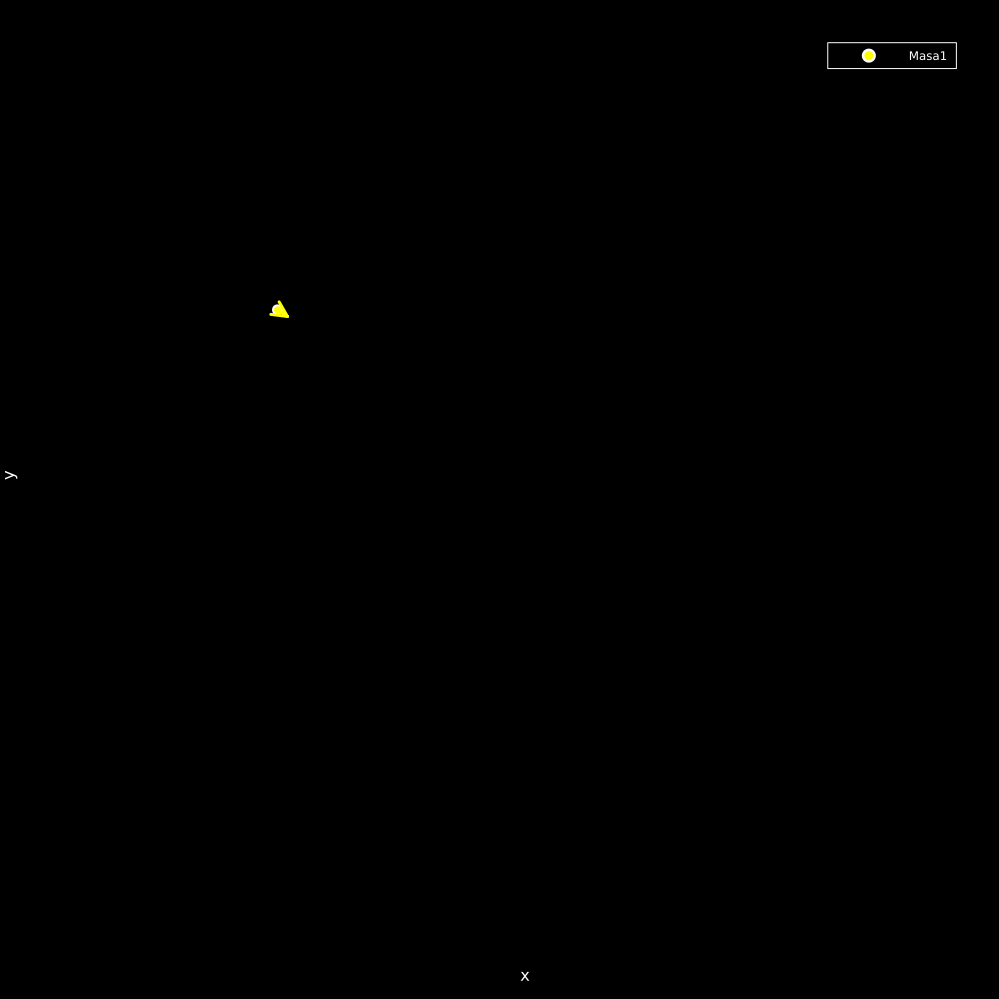

In [20]:
gif(anim2d,"Ciclotron2d.gif",fps=24)

## Animación

In [40]:
function animac(xs,ys,zs,N,n,cc,lw1,tit)
    anim2d=@animate for i in 1:1:n;
        gr(size=(1000,1000))
        a=1
        j=1
        if i>1
            j=Int(ceil(i*0.3))
            a=range(0,1,length=(i-j+1))
        end
        d=1
        Plots.plot(xs[:,j:i]',ys[:,j:i]',zs[:,j:i]',lw=lw1,label="",xlabel=L"X \mu m",ylabel=L"Y \mu m",bgcolor="black",alpha=a,xlim = [minimum(xs), maximum(xs)],ylim = [minimum(ys), maximum(ys)],aspect_ratio=:equal,camera = (i*cc, 20));
        Plots.scatter!(xs[:,i]',ys[:,i]',zs[:,i]',markersize = 4,markershape=:star4);
    end;
    gif(anim2d,tit*".gif",fps=24)
end

animac (generic function with 1 method)